### Dependences

In [1]:
import sys
sys.path.append("../")

import numpy as np
import tensorflow as tf

from PIL import Image
from tqdm import tqdm

import matplotlib.pyplot as plt
from IPython.display import clear_output

from lib.models.Deeper_SRCNN import DeeperSRCNN
import lib.utils as utils


### Loading experiment data

In [2]:
#set experiment ID
EXP_ID = "DeeperSRCNN"
utils.create_experiment_folders(EXP_ID)
utils.load_experiment_data()


### Model instantiation

In [3]:
model = DeeperSRCNN()
model.build((None,200,200,1))
print(model.summary())


Model: "deeper_srcnn"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              multiple                  832       
_________________________________________________________________
sequential (Sequential)      multiple                  76896     
_________________________________________________________________
sequential_1 (Sequential)    multiple                  76896     
_________________________________________________________________
sequential_2 (Sequential)    multiple                  76896     
_________________________________________________________________
sequential_3 (Sequential)    multiple                  76896     
_________________________________________________________________
sequential_4 (Sequential)    multiple                  76896     
_________________________________________________________________
sequential_5 (Sequential)    multiple                 

### Loading Dataset

In [4]:
dct_scale = 256

#Loading the training dataset
train_x_seismic, train_y_seismic, _, _ = utils.load_dataset(
    "../../dataset/croped/gen", DCTScale=dct_scale, replace_vec=["gen","train"], limit=None)


qtd_traning = train_x_seismic.shape[0]
print("Loaded",qtd_traning, "samples")


1794it [00:04, 392.39it/s]


Loaded 1794 samples


In [5]:
#Loading the training dataset
valid_x_seismic_1, valid_y_seismic_1,  = utils.load_dataset_from_file("../extra/valid1.txt")
valid_x_seismic_2, valid_y_seismic_2,  = utils.load_dataset_from_file("../extra/valid2.txt")
valid_x_seismic_3, valid_y_seismic_3,  = utils.load_dataset_from_file("../extra/valid3.txt")

qtd_traning = valid_x_seismic_1.shape[0]
print("Valid. Set 1 loaded",qtd_traning, "samples")

qtd_traning = valid_x_seismic_2.shape[0]
print("Valid. Set 2 loaded",qtd_traning, "samples")

qtd_traning = valid_x_seismic_3.shape[0]
print("Valid. Set 3 loaded",qtd_traning, "samples")


100%|█████████████████████████████████████████████████████████████████████████████| 2718/2718 [00:03<00:00, 695.24it/s]


Valid. Set 1 loaded 1056 samples
Valid. Set 2 loaded 1182 samples
Valid. Set 3 loaded 2718 samples


### Dataset Normalization and Batches split

train_batches: 225 valid_batches: 132
Preview examples from train set
batch 0


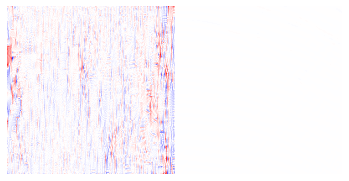

batch 1


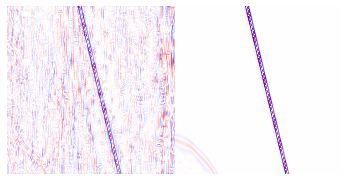

batch 2


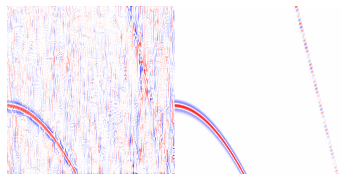

batch 3


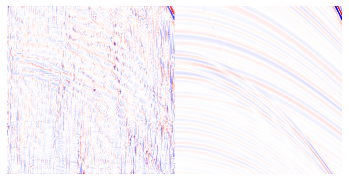

batch 4


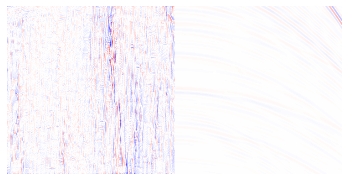

Preview examples from valid set 1
batch 0


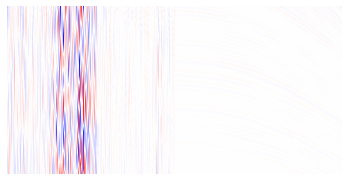

batch 1


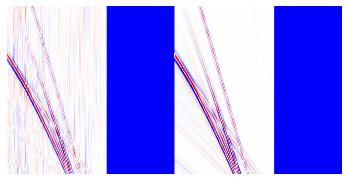

batch 2


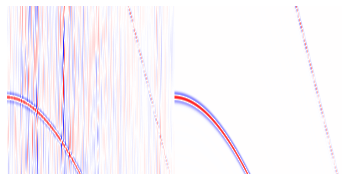

batch 3


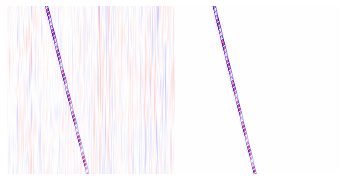

batch 4


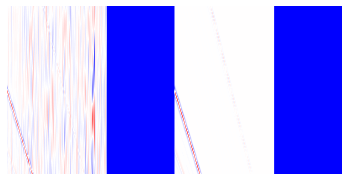

Preview examples from valid set 2
batch 0


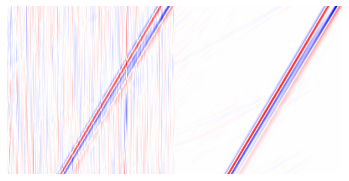

batch 1


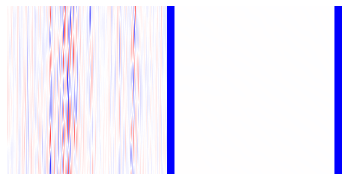

batch 2


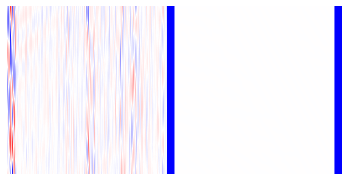

batch 3


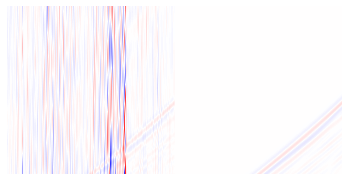

batch 4


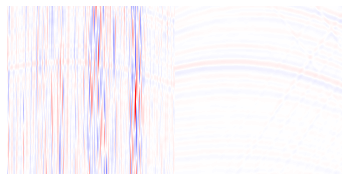

Preview examples from valid set 3
batch 0


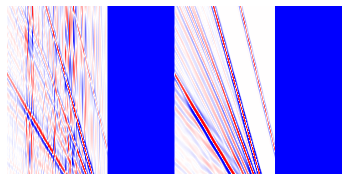

batch 1


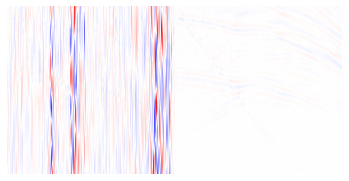

batch 2


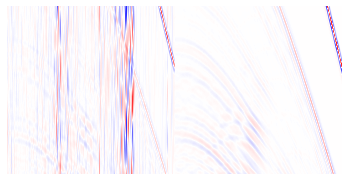

batch 3


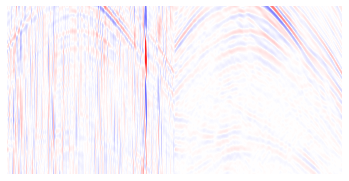

batch 4


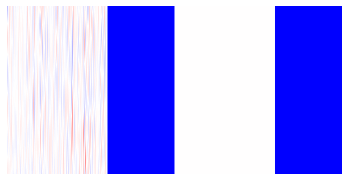

In [6]:
train_batches = utils.random_mini_batches(train_x_seismic, train_y_seismic, None, None, 8, seed=0)
valid_batches_1 = utils.random_mini_batches(valid_x_seismic_1, valid_y_seismic_1, None, None, 8, seed=0)
valid_batches_2 = utils.random_mini_batches(valid_x_seismic_2, valid_y_seismic_2, None, None, 8, seed=0)
valid_batches_3 = utils.random_mini_batches(valid_x_seismic_3, valid_y_seismic_3, None, None, 8, seed=0)

print("train_batches:", len(train_batches), "valid_batches:", len(valid_batches_1))


print("Preview examples from train set")
for index,batch in enumerate(train_batches):
    if index > 4:
        break
    (seismic_x, seismic_y, _, _) = batch
    print("batch", index)
    plt.imshow( np.hstack((seismic_x[0,:,:,0], seismic_y[0,:,:,0])) , cmap="bwr", vmin=0, vmax=1)
    plt.axis('off')
    plt.pause(0.1)
    
print("Preview examples from valid set 1")
for index, batch in enumerate(valid_batches_1):
    if index > 4:
        break
    (seismic_x, seismic_y, _, _) = batch
    print("batch", index)
    (seismic_x, seismic_y, dct_x, dct_y) = batch
    plt.imshow( np.hstack((seismic_x[0,:,:,0], seismic_y[0,:,:,0])) , cmap="bwr", vmin=0, vmax=1)
    plt.axis('off')
    plt.pause(0.1)
    
print("Preview examples from valid set 2")
for index, batch in enumerate(valid_batches_2):
    if index > 4:
        break
    (seismic_x, seismic_y, _, _) = batch
    print("batch", index)
    (seismic_x, seismic_y, dct_x, dct_y) = batch
    plt.imshow( np.hstack((seismic_x[0,:,:,0], seismic_y[0,:,:,0])) , cmap="bwr", vmin=0, vmax=1)
    plt.axis('off')
    plt.pause(0.1)
    
print("Preview examples from valid set 3")
for index, batch in enumerate(valid_batches_3):
    if index > 4:
        break
    (seismic_x, seismic_y, _, _) = batch
    print("batch", index)
    (seismic_x, seismic_y, dct_x, dct_y) = batch
    plt.imshow( np.hstack((seismic_x[0,:,:,0], seismic_y[0,:,:,0])) , cmap="bwr", vmin=0, vmax=1)
    plt.axis('off')
    plt.pause(0.1)
    

### Metrics

In [7]:
#default tf.keras metrics
train_loss = tf.keras.metrics.Mean(name='train_loss')



### Set Loss and load model weights

In [8]:
loss_object = tf.keras.losses.MeanSquaredError()
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

#get last saved epoch index and best result in validation step
CURRENT_EPOCH, BEST_VALIDATION = utils.get_model_last_data()
if CURRENT_EPOCH > 0:
    print("Loading last model state in epoch", CURRENT_EPOCH)
    model.load_weights(utils.get_exp_folder_last_epoch())
    print("Best validation result was PSNR=", BEST_VALIDATION)

Loading last model state in epoch 21
Best validation result was PSNR= 29.155913116647206


### Training

In [9]:
@tf.function
def train_step(patch_x, patch_y):
    with tf.GradientTape() as tape:
        predictions = model(patch_x)
        loss = loss_object(patch_y, predictions)
        
    gradients = tape.gradient(loss, model.trainable_variables)
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))
    train_loss(loss)

def valid_step(valid_batches):
    valid_mse = tf.keras.metrics.MeanSquaredError(name='train_mse')
    valid_custom_metrics = utils.CustomMetric()
    for index, batch in enumerate(valid_batches):
        (seismic_x, seismic_y, _, _) = batch
        predictions = model(seismic_x)
        valid_mse(seismic_y, predictions)

        predictions_seismic = predictions.numpy()

        #seismic_x = utils.remove_margin_zeros(seismic_x.copy(), size=24)
        #seismic_y = utils.remove_margin_zeros(seismic_y.copy(), size=24)
        #predictions_seismic = utils.remove_margin_zeros(predictions_seismic, size=24)

        #feed the metric evaluator
        valid_custom_metrics.feed(seismic_y, predictions_seismic)

        #just show the first example of each batch until 5
        if index < 3:
            print("Spatial domain: X - Y - PREDICT")
            plt.imshow(np.hstack((seismic_x[0,:,:,0], seismic_y[0,:,:,0], predictions_seismic[0,:,:,0])) , cmap="bwr", vmin=0, vmax=1)
            plt.axis('off')
            plt.pause(0.1)
    
    #get metric results
    psnr, nrmse = valid_custom_metrics.result()
    valid_mse_result = valid_mse.result().numpy()
    valid_custom_metrics.reset_states()
    valid_mse.reset_states()
    return psnr, nrmse, valid_mse_result
    
MAX_EPOCHS = 21
EVAL_STEP = 1

for epoch in range(CURRENT_EPOCH, MAX_EPOCHS):
    
    #TRAINING
    print("TRAINING EPOCH", epoch)
   
    for batch in train_batches:
        (seismic_x, seismic_y, _, _) = batch
        train_step(seismic_x, seismic_y)
        
    
    #VALIDATION
    if epoch%EVAL_STEP == 0:
        #tf.keras.backend.set_learning_phase(0)
        clear_output()
        
        print("VALIDATION EPOCH", epoch)
        #saving last epoch model
        model.save_weights(utils.get_exp_folder_last_epoch(), save_format='tf')
       
        #valid with set 1    
        psnr_1, nrmse_1, mse_1 = valid_step(valid_batches_1)
        psnr_2, nrmse_2, mse_2 = valid_step(valid_batches_2)
        psnr_3, nrmse_3, mse_3 = valid_step(valid_batches_3)
        
        utils.update_chart_data(epoch=epoch, train_mse=train_loss.result().numpy(), 
                                valid_mse=[mse_1,mse_2,mse_3], psnr=[psnr_1,psnr_2,psnr_3], nrmse=[nrmse_1,nrmse_2,nrmse_3])
        utils.draw_chart()
        
        #saving best validation model
        if psnr_1 > BEST_VALIDATION:
            BEST_VALIDATION = psnr_1
            model.save_weights(utils.get_exp_folder_best_valid(), save_format='tf')
        
    train_loss.reset_states()


Spatial domain: X - Y - PREDICT


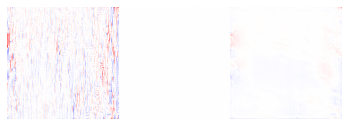

Spatial domain: X - Y - PREDICT


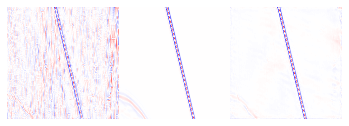

Spatial domain: X - Y - PREDICT


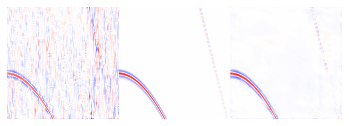

Spatial domain: X - Y - PREDICT


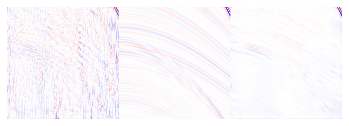

Spatial domain: X - Y - PREDICT


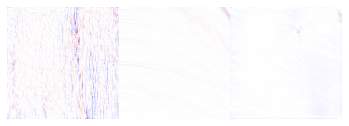

Spatial domain: X - Y - PREDICT


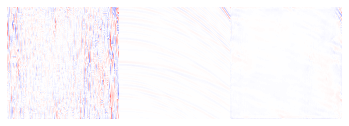

Spatial domain: X - Y - PREDICT


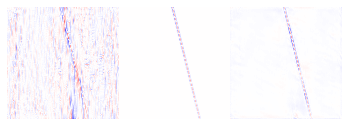

Spatial domain: X - Y - PREDICT


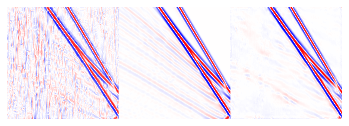

Spatial domain: X - Y - PREDICT


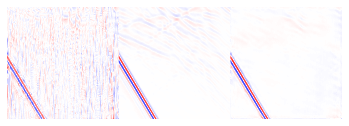

Spatial domain: X - Y - PREDICT


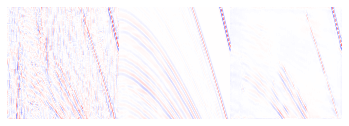

Spatial domain: X - Y - PREDICT


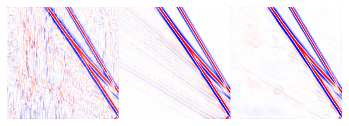

Spatial domain: X - Y - PREDICT


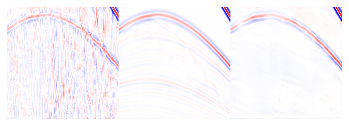

Spatial domain: X - Y - PREDICT


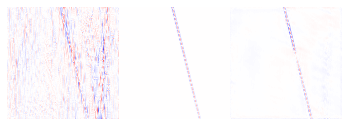

Spatial domain: X - Y - PREDICT


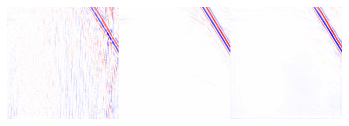

Spatial domain: X - Y - PREDICT


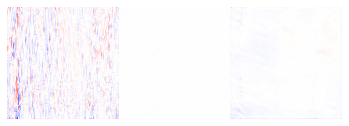

Spatial domain: X - Y - PREDICT


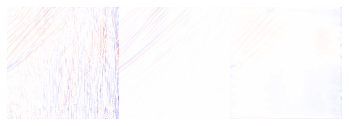

Spatial domain: X - Y - PREDICT


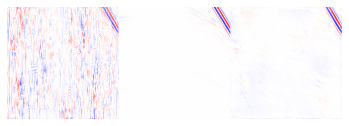

Spatial domain: X - Y - PREDICT


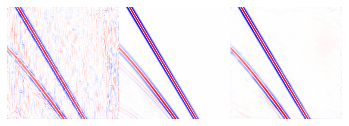

Spatial domain: X - Y - PREDICT


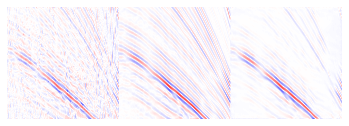

Spatial domain: X - Y - PREDICT


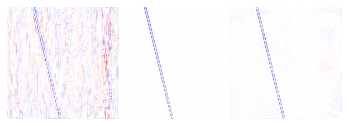

Spatial domain: X - Y - PREDICT


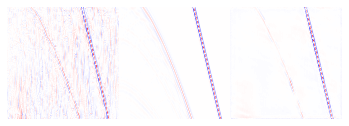

Spatial domain: X - Y - PREDICT


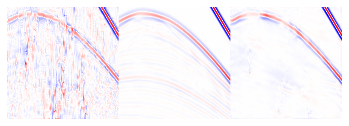

Spatial domain: X - Y - PREDICT


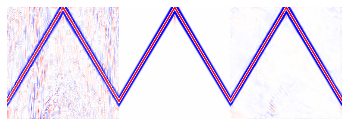

Spatial domain: X - Y - PREDICT


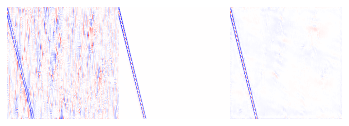

Spatial domain: X - Y - PREDICT


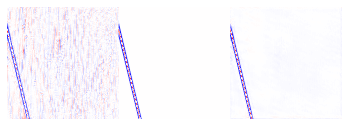

Spatial domain: X - Y - PREDICT


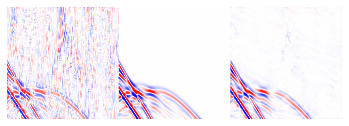

Spatial domain: X - Y - PREDICT


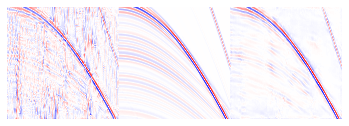

Spatial domain: X - Y - PREDICT


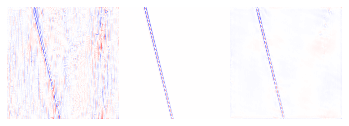

Spatial domain: X - Y - PREDICT


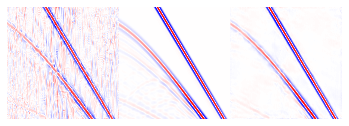

Spatial domain: X - Y - PREDICT


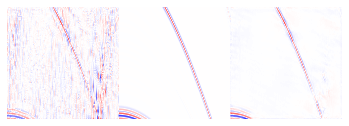

Spatial domain: X - Y - PREDICT


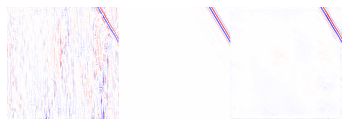

Spatial domain: X - Y - PREDICT


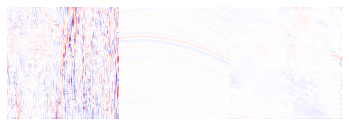

Spatial domain: X - Y - PREDICT


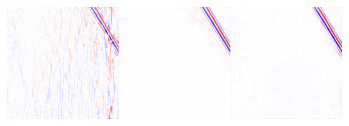

Spatial domain: X - Y - PREDICT


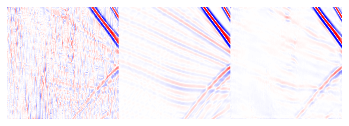

Spatial domain: X - Y - PREDICT


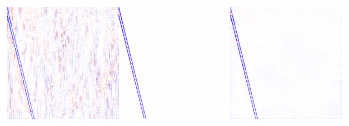

Spatial domain: X - Y - PREDICT


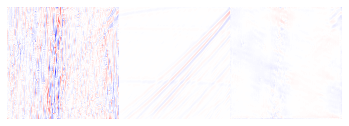

Spatial domain: X - Y - PREDICT


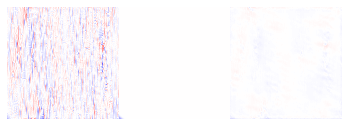

Spatial domain: X - Y - PREDICT


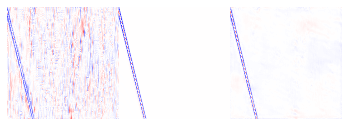

Spatial domain: X - Y - PREDICT


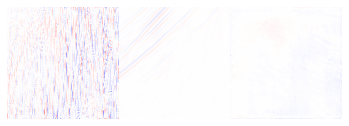

Spatial domain: X - Y - PREDICT


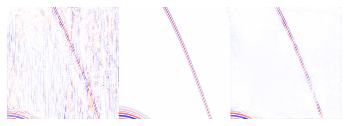

Spatial domain: X - Y - PREDICT


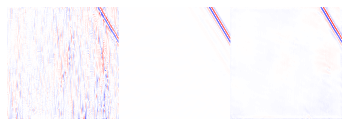

Spatial domain: X - Y - PREDICT


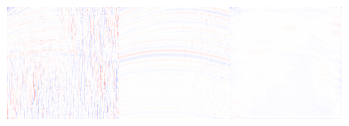

Spatial domain: X - Y - PREDICT


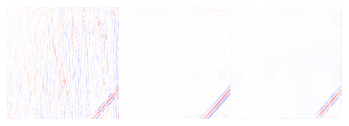

Spatial domain: X - Y - PREDICT


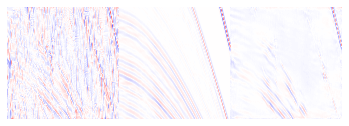

Spatial domain: X - Y - PREDICT


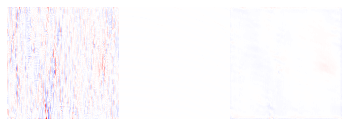

Spatial domain: X - Y - PREDICT


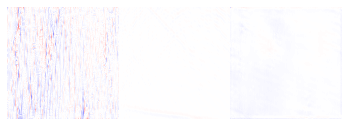

Spatial domain: X - Y - PREDICT


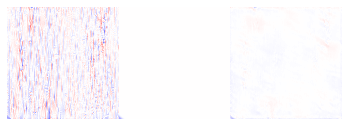

Spatial domain: X - Y - PREDICT


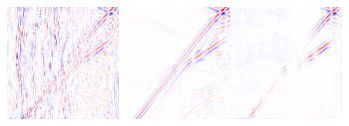

Spatial domain: X - Y - PREDICT


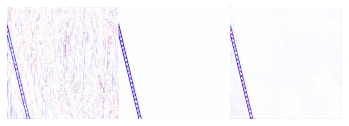

Spatial domain: X - Y - PREDICT


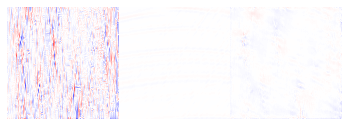

Spatial domain: X - Y - PREDICT


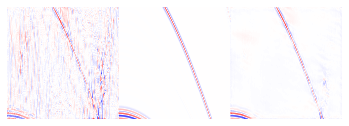

Spatial domain: X - Y - PREDICT


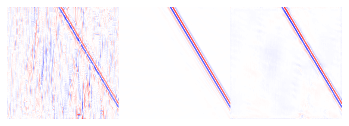

Spatial domain: X - Y - PREDICT


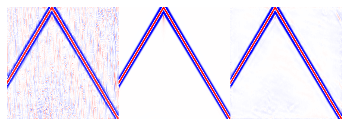

Spatial domain: X - Y - PREDICT


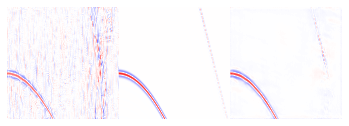

Spatial domain: X - Y - PREDICT


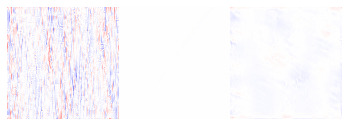

Spatial domain: X - Y - PREDICT


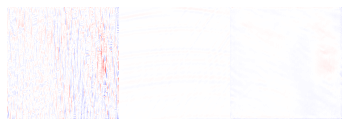

Spatial domain: X - Y - PREDICT


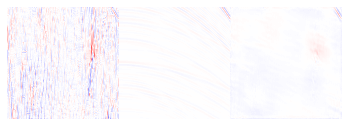

Spatial domain: X - Y - PREDICT


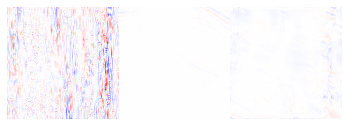

Spatial domain: X - Y - PREDICT


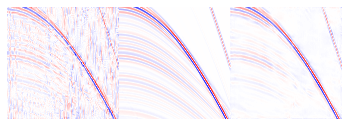

Spatial domain: X - Y - PREDICT


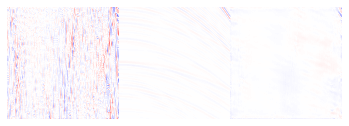

Spatial domain: X - Y - PREDICT


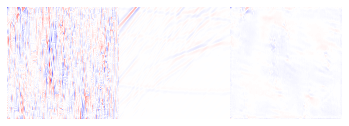

Spatial domain: X - Y - PREDICT


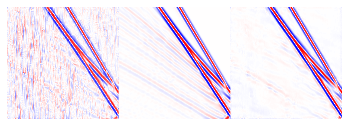

Spatial domain: X - Y - PREDICT


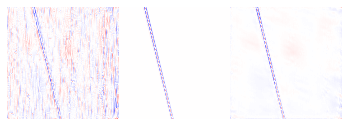

Spatial domain: X - Y - PREDICT


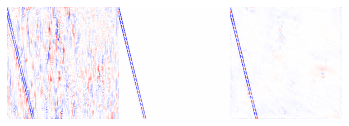

Spatial domain: X - Y - PREDICT


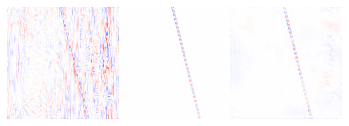

Spatial domain: X - Y - PREDICT


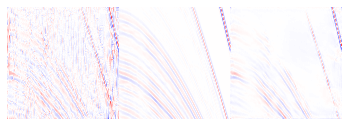

Spatial domain: X - Y - PREDICT


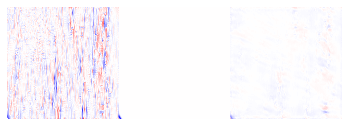

Spatial domain: X - Y - PREDICT


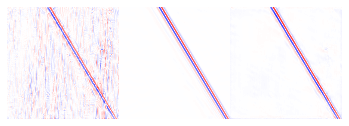

Spatial domain: X - Y - PREDICT


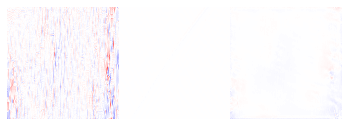

Spatial domain: X - Y - PREDICT


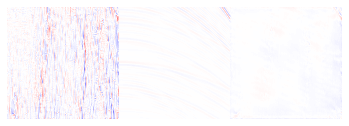

Spatial domain: X - Y - PREDICT


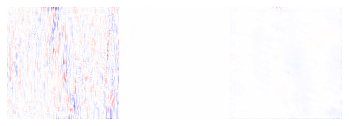

Spatial domain: X - Y - PREDICT


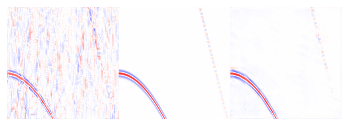

Spatial domain: X - Y - PREDICT


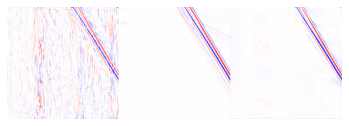

Spatial domain: X - Y - PREDICT


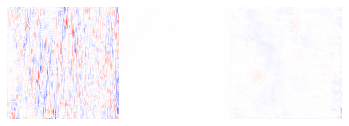

Spatial domain: X - Y - PREDICT


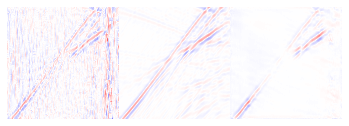

Spatial domain: X - Y - PREDICT


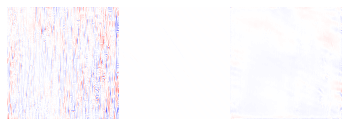

Spatial domain: X - Y - PREDICT


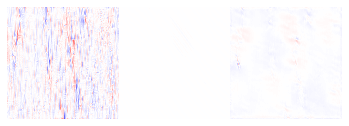

Spatial domain: X - Y - PREDICT


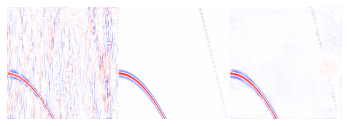

Spatial domain: X - Y - PREDICT


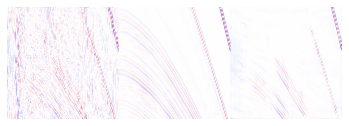

Spatial domain: X - Y - PREDICT


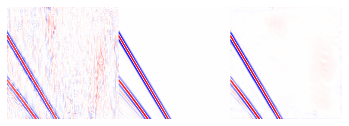

Spatial domain: X - Y - PREDICT


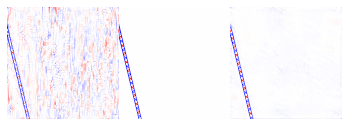

Spatial domain: X - Y - PREDICT


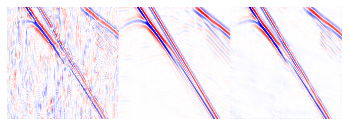

Spatial domain: X - Y - PREDICT


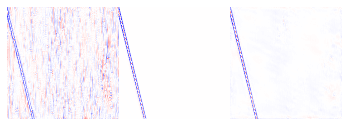

Spatial domain: X - Y - PREDICT


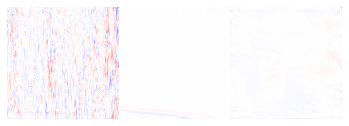

Spatial domain: X - Y - PREDICT


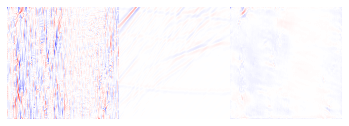

Spatial domain: X - Y - PREDICT


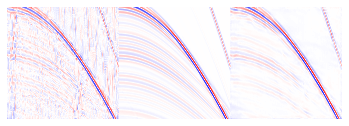

Spatial domain: X - Y - PREDICT


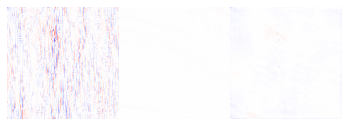

Spatial domain: X - Y - PREDICT


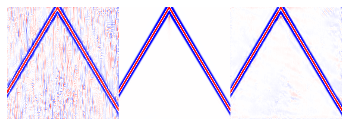

Spatial domain: X - Y - PREDICT


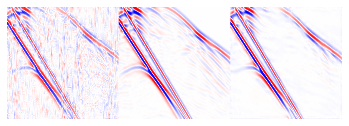

Spatial domain: X - Y - PREDICT


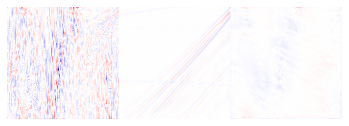

Spatial domain: X - Y - PREDICT


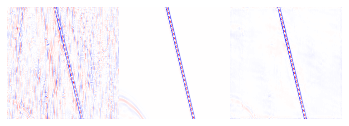

Spatial domain: X - Y - PREDICT


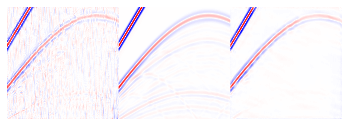

Spatial domain: X - Y - PREDICT


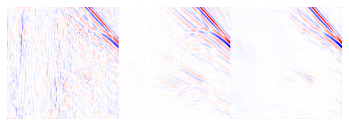

Spatial domain: X - Y - PREDICT


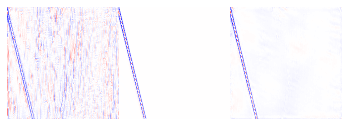

Spatial domain: X - Y - PREDICT


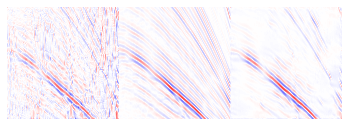

Spatial domain: X - Y - PREDICT


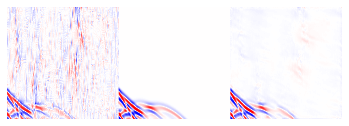

Spatial domain: X - Y - PREDICT


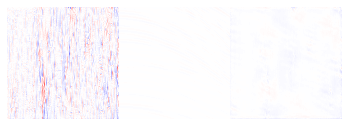

Spatial domain: X - Y - PREDICT


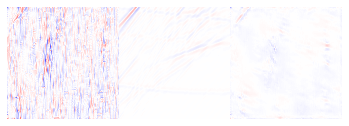

Spatial domain: X - Y - PREDICT


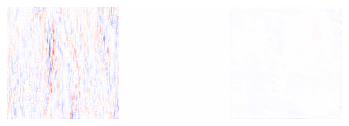

Spatial domain: X - Y - PREDICT


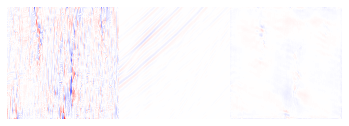

Spatial domain: X - Y - PREDICT


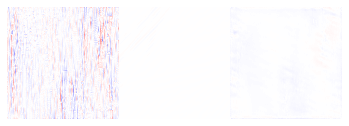

Spatial domain: X - Y - PREDICT


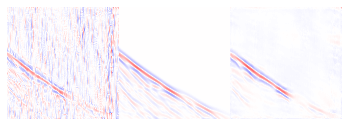

Spatial domain: X - Y - PREDICT


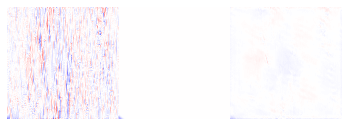

Spatial domain: X - Y - PREDICT


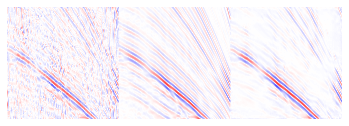

Spatial domain: X - Y - PREDICT


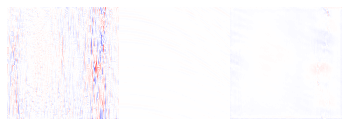

Spatial domain: X - Y - PREDICT


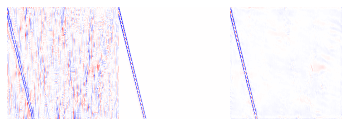

Spatial domain: X - Y - PREDICT


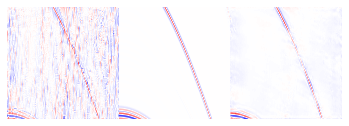

Spatial domain: X - Y - PREDICT


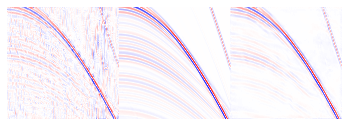

Spatial domain: X - Y - PREDICT


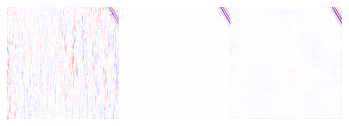

Spatial domain: X - Y - PREDICT


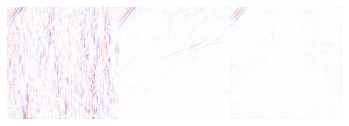

Spatial domain: X - Y - PREDICT


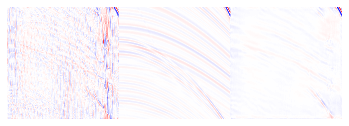

Spatial domain: X - Y - PREDICT


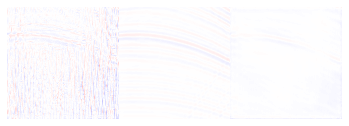

Spatial domain: X - Y - PREDICT


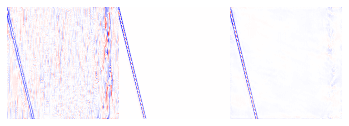

Spatial domain: X - Y - PREDICT


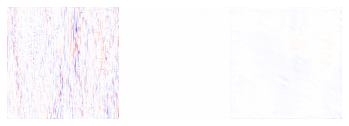

Spatial domain: X - Y - PREDICT


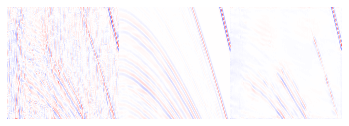

Spatial domain: X - Y - PREDICT


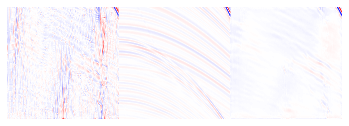

Spatial domain: X - Y - PREDICT


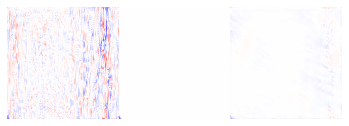

Spatial domain: X - Y - PREDICT


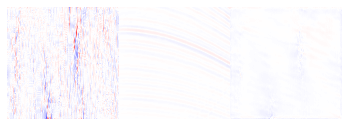

Spatial domain: X - Y - PREDICT


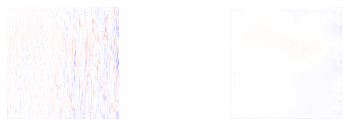

Spatial domain: X - Y - PREDICT


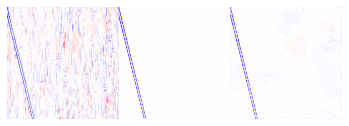

Spatial domain: X - Y - PREDICT


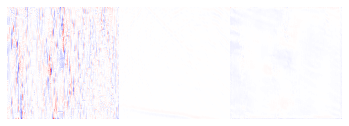

Spatial domain: X - Y - PREDICT


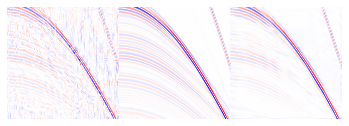

Spatial domain: X - Y - PREDICT


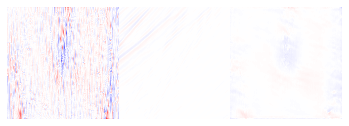

Spatial domain: X - Y - PREDICT


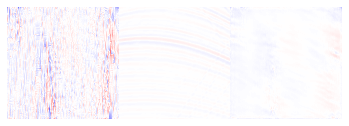

Spatial domain: X - Y - PREDICT


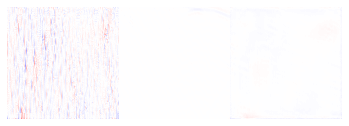

Spatial domain: X - Y - PREDICT


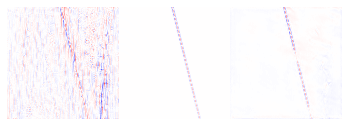

Spatial domain: X - Y - PREDICT


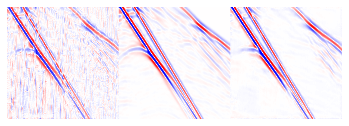

Spatial domain: X - Y - PREDICT


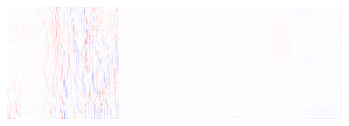

Spatial domain: X - Y - PREDICT


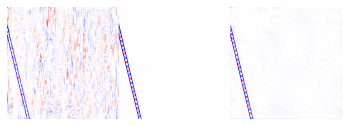

Spatial domain: X - Y - PREDICT


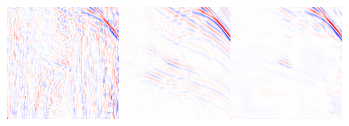

Spatial domain: X - Y - PREDICT


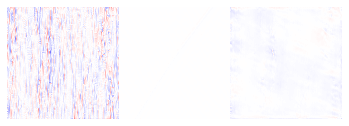

Spatial domain: X - Y - PREDICT


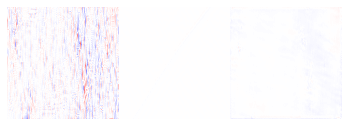

Spatial domain: X - Y - PREDICT


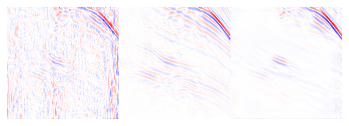

Spatial domain: X - Y - PREDICT


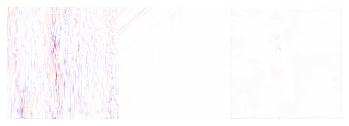

Spatial domain: X - Y - PREDICT


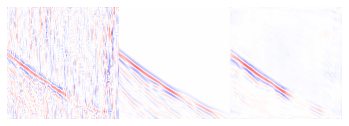

Spatial domain: X - Y - PREDICT


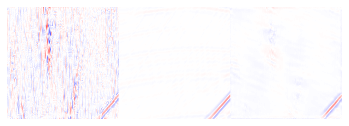

Spatial domain: X - Y - PREDICT


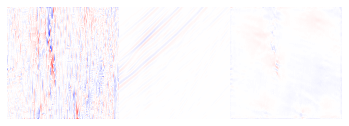

Spatial domain: X - Y - PREDICT


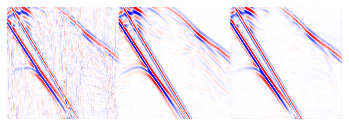

Spatial domain: X - Y - PREDICT


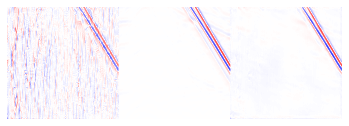

Spatial domain: X - Y - PREDICT


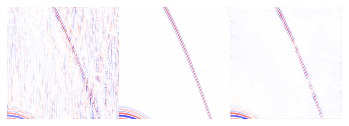

Spatial domain: X - Y - PREDICT


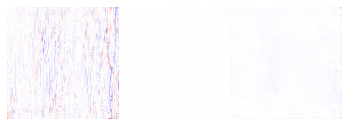

Spatial domain: X - Y - PREDICT


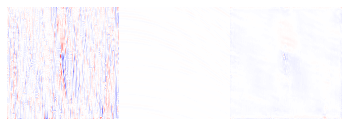

Spatial domain: X - Y - PREDICT


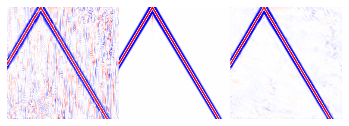

Spatial domain: X - Y - PREDICT


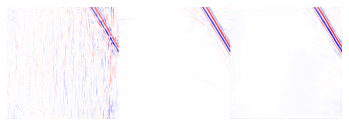

Spatial domain: X - Y - PREDICT


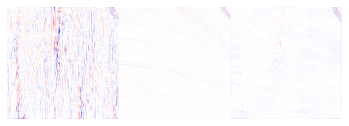

Spatial domain: X - Y - PREDICT


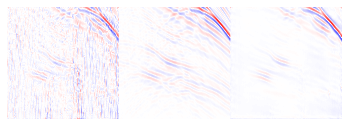

Spatial domain: X - Y - PREDICT


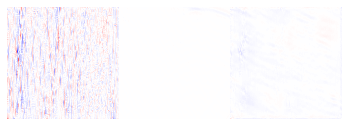

Spatial domain: X - Y - PREDICT


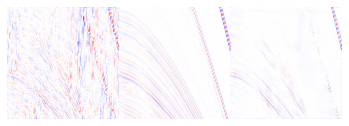

Spatial domain: X - Y - PREDICT


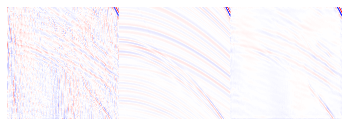

Spatial domain: X - Y - PREDICT


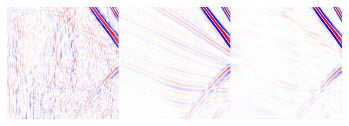

Spatial domain: X - Y - PREDICT


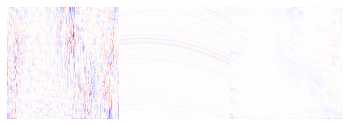

Spatial domain: X - Y - PREDICT


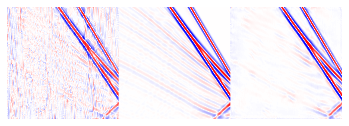

Spatial domain: X - Y - PREDICT


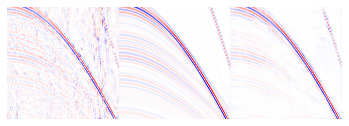

Spatial domain: X - Y - PREDICT


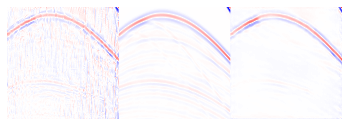

Spatial domain: X - Y - PREDICT


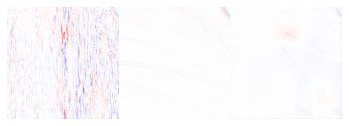

Spatial domain: X - Y - PREDICT


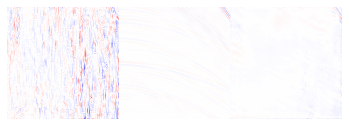

Spatial domain: X - Y - PREDICT


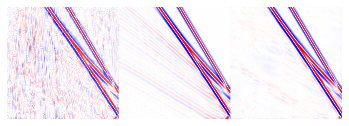

Spatial domain: X - Y - PREDICT


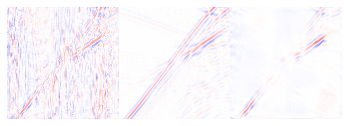

Spatial domain: X - Y - PREDICT


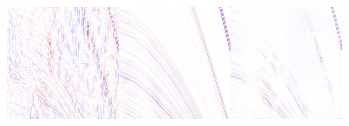

Spatial domain: X - Y - PREDICT


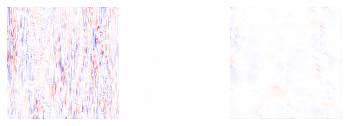

Spatial domain: X - Y - PREDICT


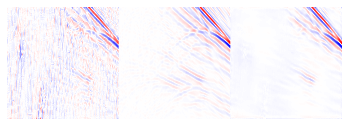

Spatial domain: X - Y - PREDICT


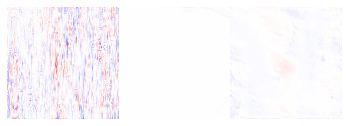

Spatial domain: X - Y - PREDICT


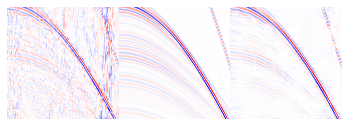

Spatial domain: X - Y - PREDICT


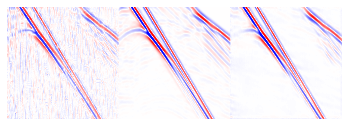

Spatial domain: X - Y - PREDICT


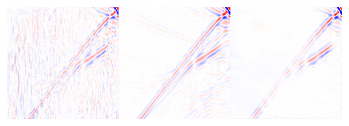

Spatial domain: X - Y - PREDICT


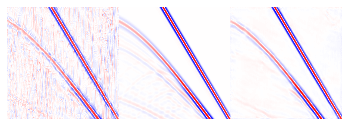

Spatial domain: X - Y - PREDICT


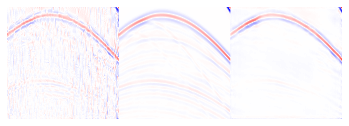

Spatial domain: X - Y - PREDICT


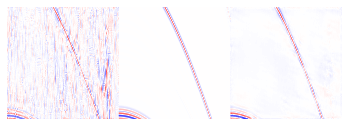

Spatial domain: X - Y - PREDICT


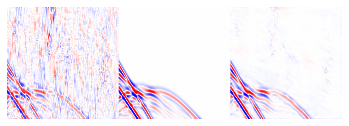

Spatial domain: X - Y - PREDICT


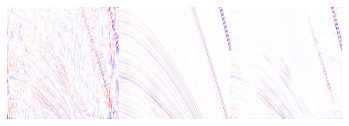

Spatial domain: X - Y - PREDICT


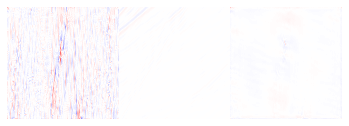

Spatial domain: X - Y - PREDICT


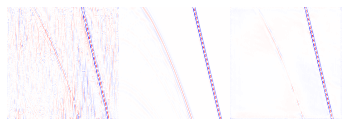

Spatial domain: X - Y - PREDICT


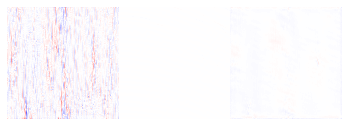

Spatial domain: X - Y - PREDICT


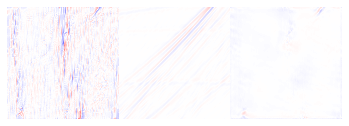

Spatial domain: X - Y - PREDICT


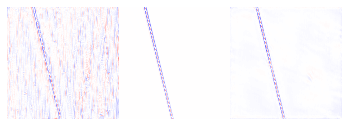

Spatial domain: X - Y - PREDICT


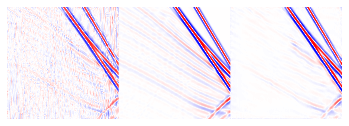

Spatial domain: X - Y - PREDICT


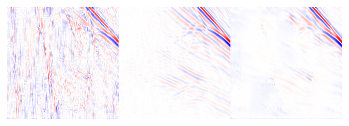

Spatial domain: X - Y - PREDICT


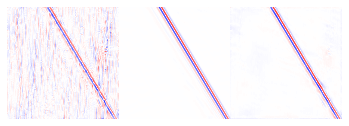

Spatial domain: X - Y - PREDICT


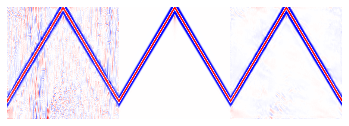

Spatial domain: X - Y - PREDICT


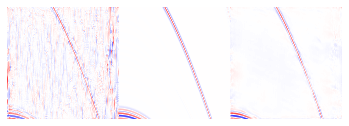

Spatial domain: X - Y - PREDICT


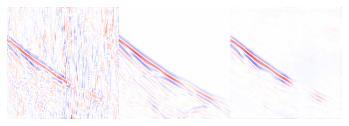

Spatial domain: X - Y - PREDICT


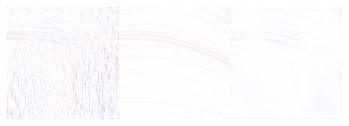

Spatial domain: X - Y - PREDICT


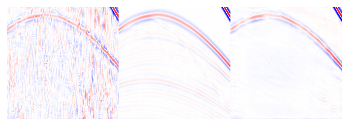

Spatial domain: X - Y - PREDICT


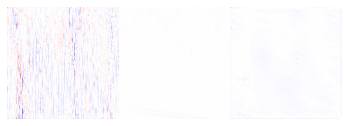

Spatial domain: X - Y - PREDICT


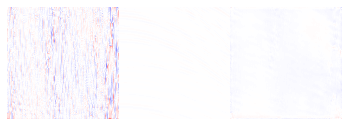

Spatial domain: X - Y - PREDICT


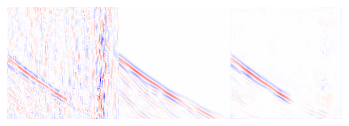

Spatial domain: X - Y - PREDICT


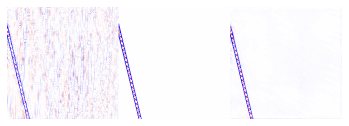

Spatial domain: X - Y - PREDICT


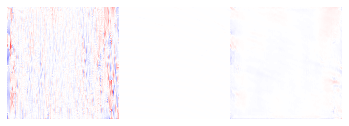

Spatial domain: X - Y - PREDICT


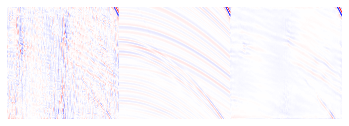

Spatial domain: X - Y - PREDICT


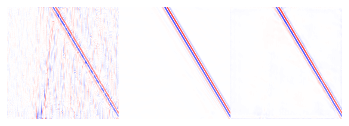

Spatial domain: X - Y - PREDICT


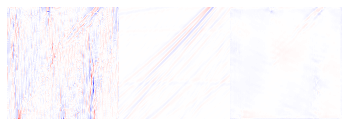

Spatial domain: X - Y - PREDICT


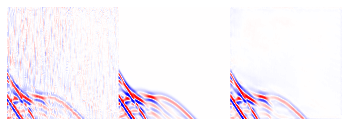

Spatial domain: X - Y - PREDICT


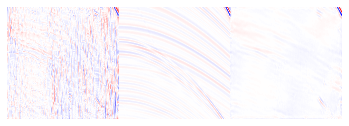

Spatial domain: X - Y - PREDICT


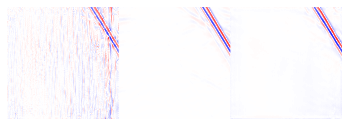

Spatial domain: X - Y - PREDICT


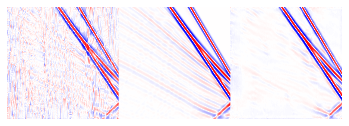

Spatial domain: X - Y - PREDICT


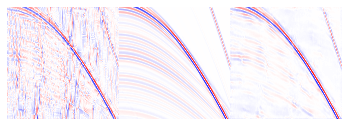

Spatial domain: X - Y - PREDICT


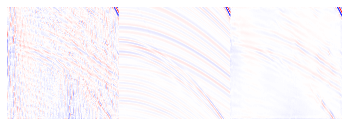

Spatial domain: X - Y - PREDICT


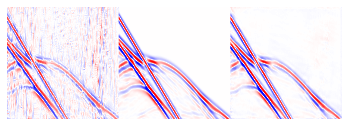

Spatial domain: X - Y - PREDICT


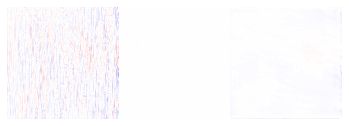

Spatial domain: X - Y - PREDICT


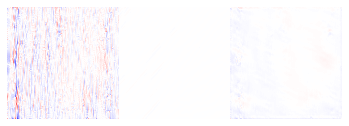

Spatial domain: X - Y - PREDICT


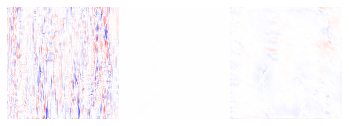

Spatial domain: X - Y - PREDICT


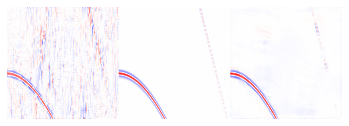

Spatial domain: X - Y - PREDICT


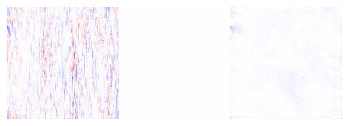

Spatial domain: X - Y - PREDICT


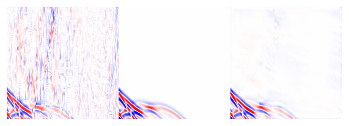

Spatial domain: X - Y - PREDICT


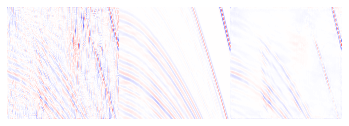

Spatial domain: X - Y - PREDICT


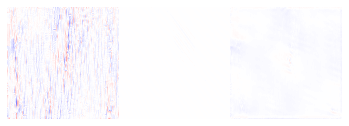

Spatial domain: X - Y - PREDICT


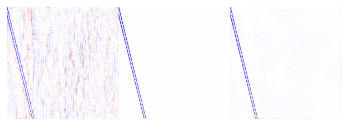

Spatial domain: X - Y - PREDICT


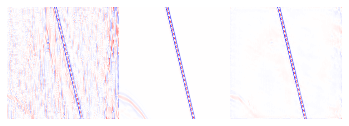

Spatial domain: X - Y - PREDICT


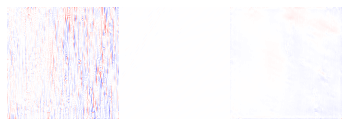

Spatial domain: X - Y - PREDICT


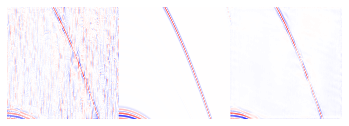

Spatial domain: X - Y - PREDICT


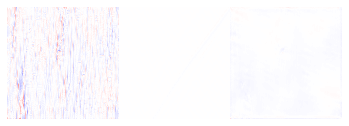

Spatial domain: X - Y - PREDICT


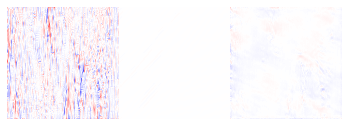

Spatial domain: X - Y - PREDICT


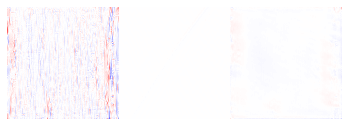

Spatial domain: X - Y - PREDICT


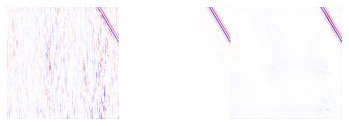

Spatial domain: X - Y - PREDICT


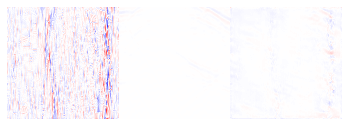

Spatial domain: X - Y - PREDICT


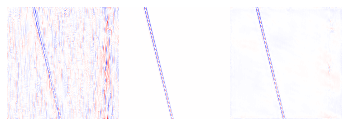

Spatial domain: X - Y - PREDICT


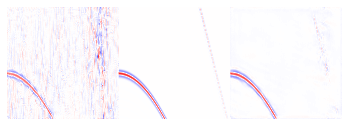

Spatial domain: X - Y - PREDICT


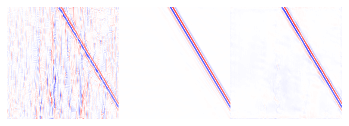

Spatial domain: X - Y - PREDICT


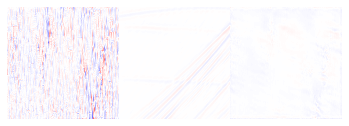

Spatial domain: X - Y - PREDICT


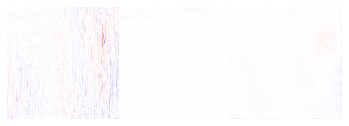

Spatial domain: X - Y - PREDICT


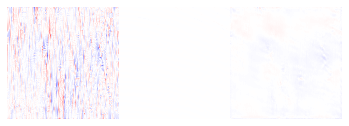

Spatial domain: X - Y - PREDICT


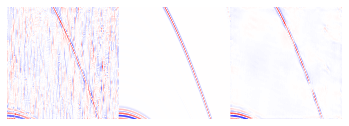

Spatial domain: X - Y - PREDICT


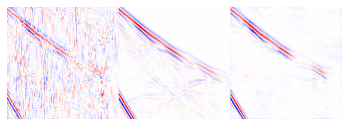

Spatial domain: X - Y - PREDICT


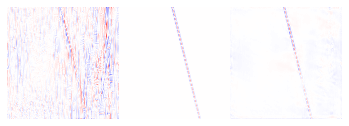

Spatial domain: X - Y - PREDICT


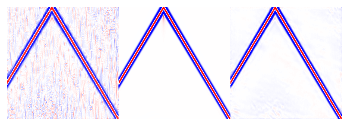

In [10]:
#view train folder
model.load_weights(utils.get_exp_folder_best_valid())

for index, batch in enumerate(train_batches):
    (seismic_x, seismic_y, dct_x, dct_y) = batch
    predictions = model(seismic_x)         
    predictions_seismic = predictions.numpy()
             
    print("Spatial domain: X - Y - PREDICT")
    plt.imshow(np.hstack((seismic_x[0,:,:,0], seismic_y[0,:,:,0], predictions_seismic[0,:,:,0])) , cmap="bwr", vmin=0, vmax=1)
    plt.axis('off')
    plt.pause(0.1)
    

In [11]:
print(utils.get_experiment_results())

{'Best_Valid': 29.155913116647206, 'Best_Epoch': 6, 'PSNR_1': 29.155913116647206, 'PSNR_2': 30.563078046397013, 'PSNR_3': 29.22775163295604, 'NRMSE_1': 0.12937974937926167, 'NRMSE_2': 0.13182967922261649, 'NRMSE_3': 0.09306987242619322}


## Test

In [12]:
test_x_seismic, test_y_seismic,  = utils.load_dataset_from_file("../extra/test.txt")

#add border with size 24. 200x200 -> 224x224
#test_x_seismic = utils.add_margin_zeros(test_x_seismic, size=24)
#test_y_seismic = utils.add_margin_zeros(test_y_seismic, size=24)

test_batches = utils.random_mini_batches(test_x_seismic, test_y_seismic, None, None, 8, seed=0)

test_mse = tf.keras.metrics.MeanSquaredError(name='train_mse')
test_custom_metrics = utils.CustomMetric()
for index, batch in enumerate(test_batches):
    (seismic_x, seismic_y, _, _) = batch
    predictions = model(seismic_x)
    test_mse(seismic_y, predictions)

    predictions_seismic = predictions.numpy()

    #seismic_x = utils.remove_margin_zeros(seismic_x.copy(), size=24)
    #seismic_y = utils.remove_margin_zeros(seismic_y.copy(), size=24)
    #predictions_seismic = utils.remove_margin_zeros(predictions_seismic, size=24)

    #feed the metric evaluator
    test_custom_metrics.feed(seismic_y, predictions_seismic)

    #just show the first example of each batch until 5    
    print("Spatial domain: X - Y - PREDICT")
    plt.imshow(np.hstack((seismic_x[0,:,:,0], seismic_y[0,:,:,0], predictions_seismic[0,:,:,0], np.abs(predictions_seismic[0,:,:,0]-seismic_y[0,:,:,0]))) , cmap="gray", vmin=0, vmax=1)
    plt.axis('off')
    plt.pause(0.1)
    
#get metric results
psnr, nrmse = test_custom_metrics.result()
test_mse_result = test_mse.result().numpy()
test_custom_metrics.reset_states()
test_mse.reset_states()
    
print("PSNR:", psnr,"\nNRMSE", nrmse)
    
    


 35%|███████████████████████████▏                                                  | 2218/6372 [00:31<00:59, 69.54it/s]


KeyboardInterrupt: 